Rita Kurban

Professor Shekhar

In [14]:
# Install all the necessary packages
import matplotlib.pyplot as plt
from sklearn import decomposition
from pylab import *
from PIL import Image
from skimage import io
from os import listdir
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

## Image Processing

In [15]:
def img_processing(path, size):
    """Resize and crop an image. The input is the path to the image
    and a tuple of two sizes: width and height. The function first checks
    the ratio of the image and crops horizontally or vertically based on
    this ratio. After that, it transforms the image into a 1-D array.
    """
    img = Image.open(path)
    
    # Get current and desired ratio for the images
    current = img.size[0] / float(img.size[1])
    desired = size[0] / float(size[1])
    
    if current == desired:
        # There is no need to crop, so we simply resize the image
        img = img.resize((size[0], size[1]), Image.ANTIALIAS)
   
    elif desired > current:
        # Resize the image so that the ratio stays the same
        img = img.resize((int(size[0]), int(size[0]
                        * img.size[1] / img.size[0])),
                Image.ANTIALIAS)
        # As height is bigger that the width, crop the image vertically
        new_size = (0, (img.size[1] - size[1]) / 2,
            img.size[0], (img.size[1] + size[1]) / 2)
        img = img.crop(new_size)
    else:
        img = img.resize((int(size[1] * img.size[0] 
                        / img.size[1]), int(size[1])),
                Image.ANTIALIAS)
        # As width is bigger that the height, crop the image horizontally
        new_size = ((img.size[0] - size[0]) / 2,
        0, (img.size[0] + size[0]) / 2, img.size[1])
        img = img.crop(new_size)
        
    # Turn the image into 1-D Array
    img = np.array(list(img.getdata()))
    result = img.reshape(1, -1)
    return result[0]

In [120]:
def show_image(array):
    """Transform the array so that io.imshow
    function can use it as an input. 
    """
    img = Image.new('RGB',(512,512))
    arr = np.empty((262144,), dtype=object)
    arr[:]=[tuple([int(pixels) for pixels in line])
            for line in array.reshape(262144, 3)]
    img.putdata(arr)
    return np.asarray(img)

## Main Body

In [ ]:
# Load the data
path = '/Users/ritakurban/Downloads/LBA-CS156/'
data = []
names = []
for img in listdir(path):
    img_path = path + img
    data.append(img_processing(img_path, (512, 512)))

In [102]:
# Fit PCA in 2 and 3 dimensions
pca_2 = decomposition.PCA(n_components = 2)
pca_3 = decomposition.PCA(n_components = 3)
pca_2.fit(data)
pca_3.fit(data)

PCA(copy=True, iterated_power='auto', n_components=3, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

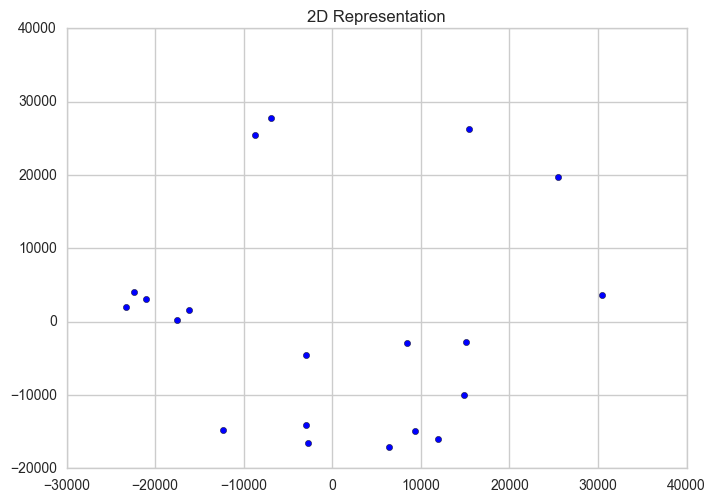

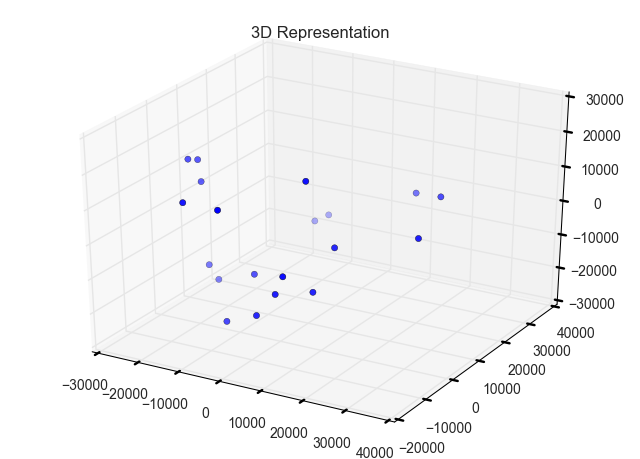

In [60]:
# Transform the images and plot them in 2 and 3 dimensions.
matplotlib.style.use('seaborn-whitegrid')
trans_2 = pca_2.transform(data)


x = trans_2[:, 0]
y = trans_2[:, 1]
plt.scatter(x,y)
plt.title("2D Representation")
plt.show()

trans_3 = pca_3.transform(data)



X = trans_3[:, 0]
Y = trans_3[:, 1]
Z = trans_3[:, 2]

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X,Y,Z)
plt.title("3D Representation")

show()

As we can see from the plots, the points are randomly distributed but are still pretty close to each other.

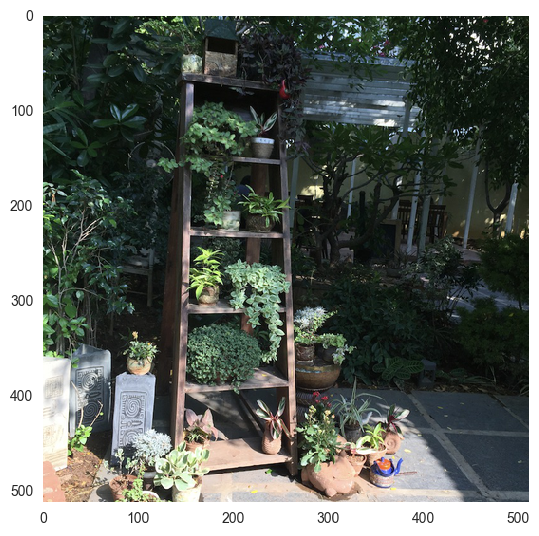

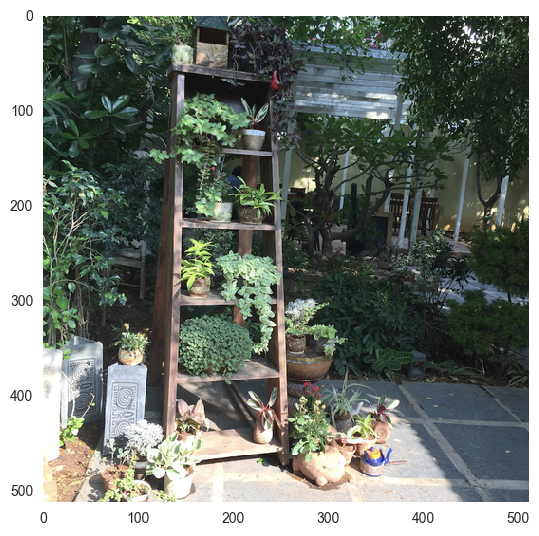

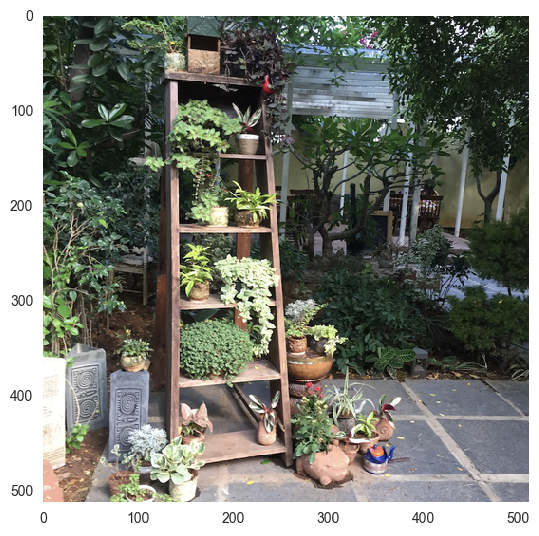

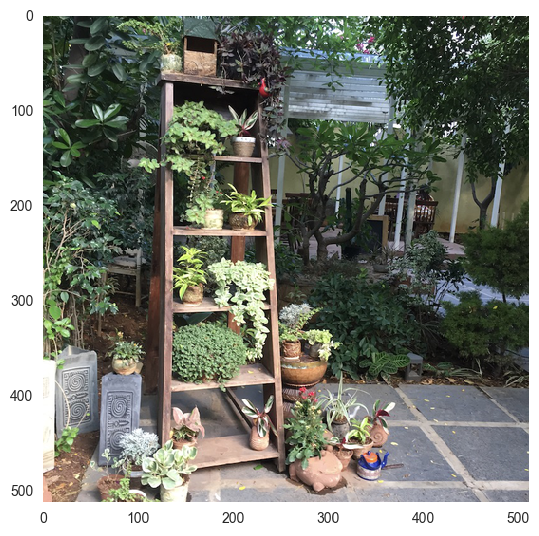

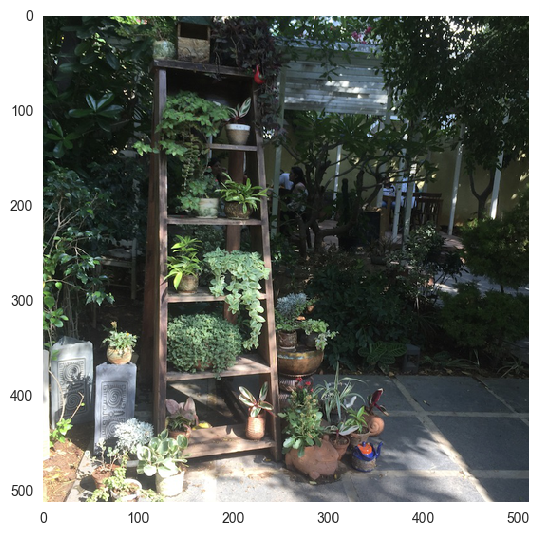

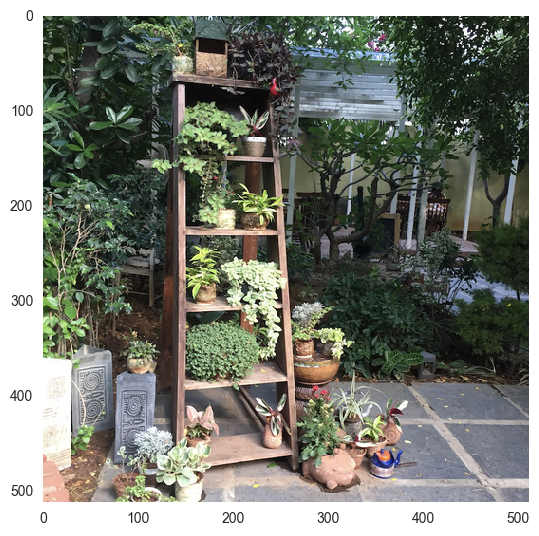

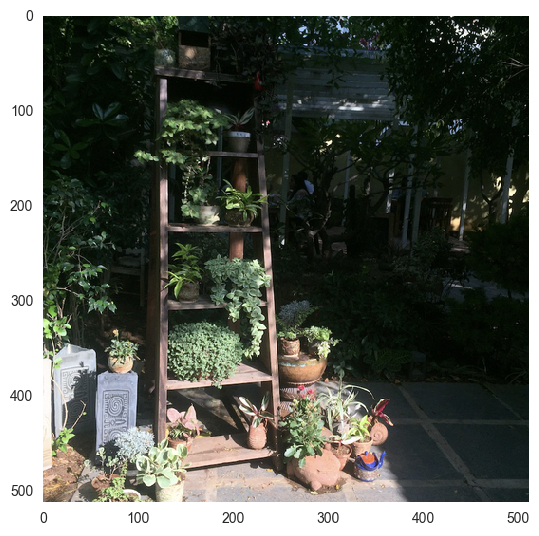

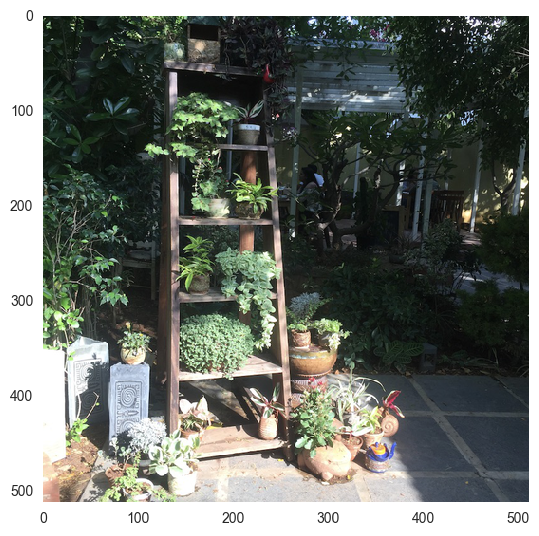

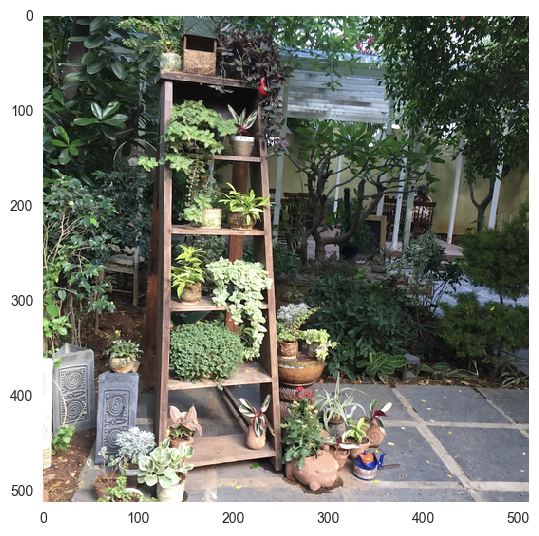

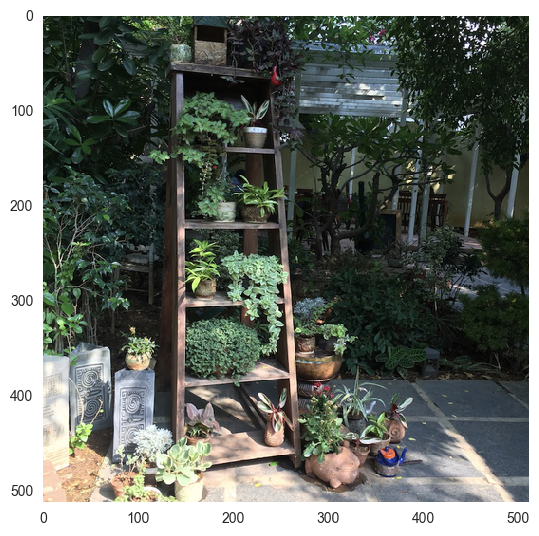

In [48]:
# Original images
matplotlib.style.use("seaborn-dark")
for i in range(10):
        io.imshow(show_image(data[i]))
        show()


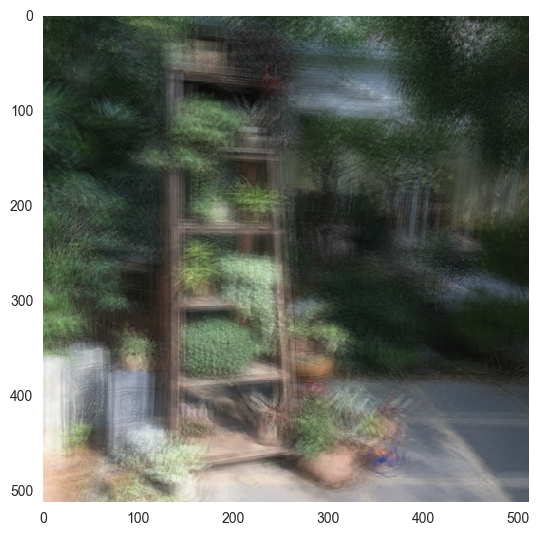

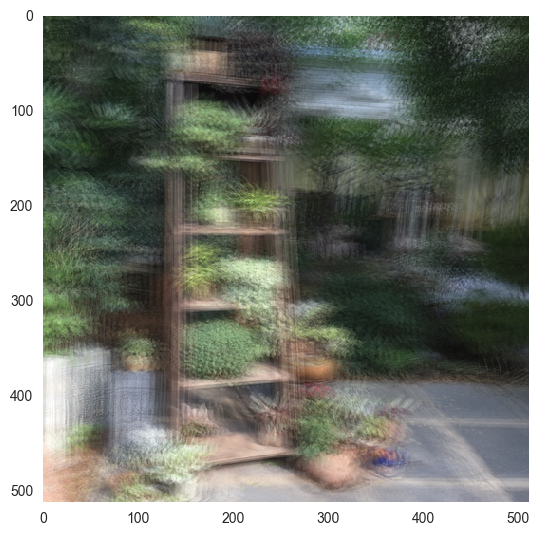

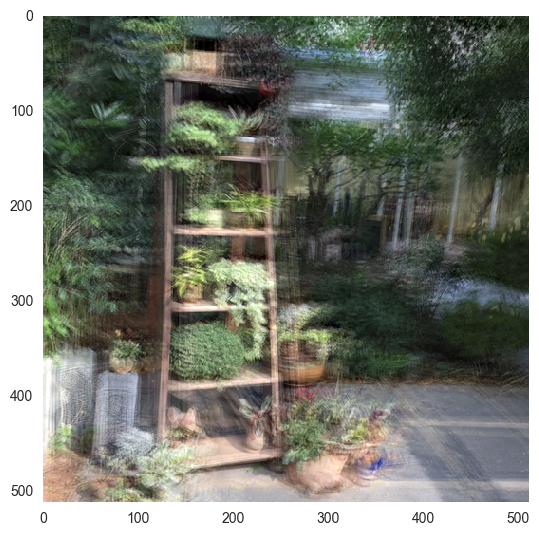

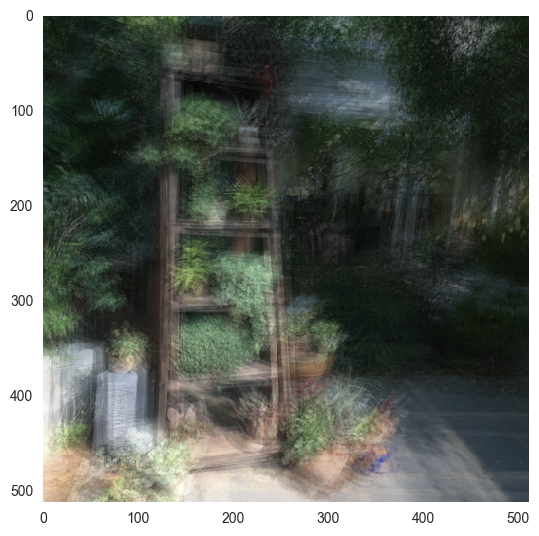

In [134]:
# Reconstructions of 2D images (the first 5)
inverse_2 = pca_2.inverse_transform(trans_2)
matplotlib.style.use("seaborn-dark")
for i in range(1,5):
        io.imshow(show_image(inverse_2[i]))
        show()


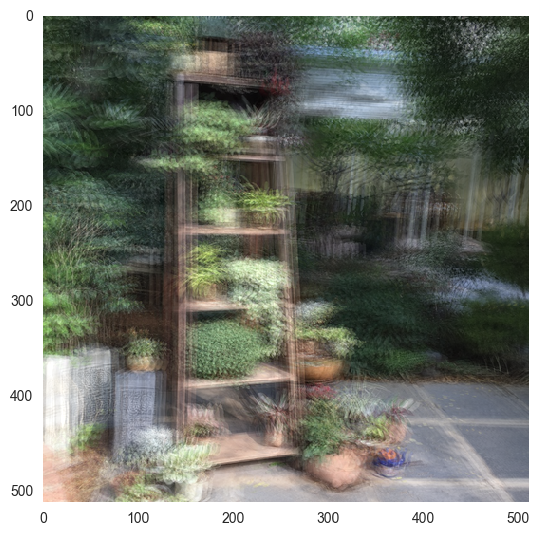

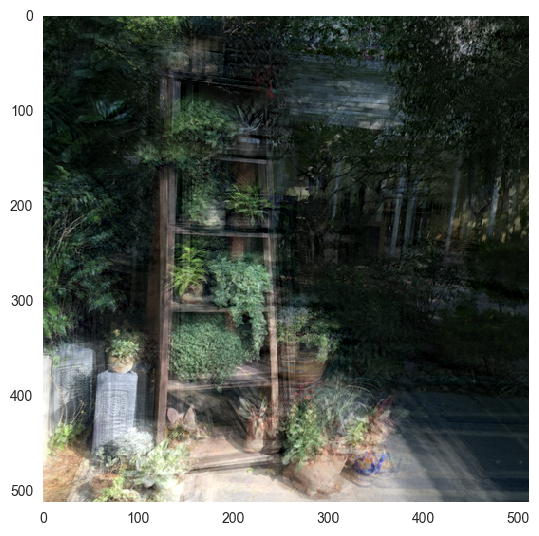

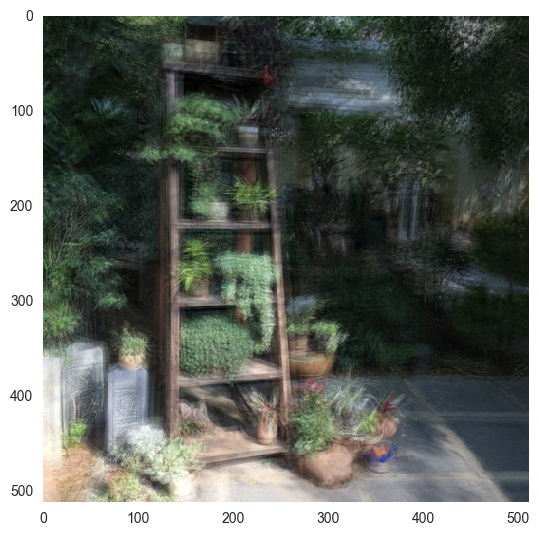

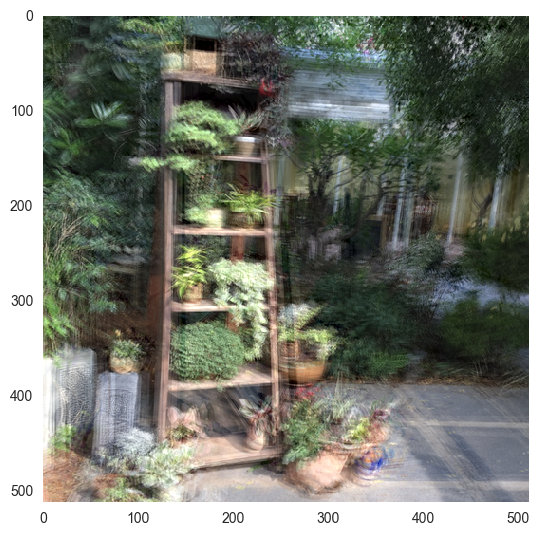

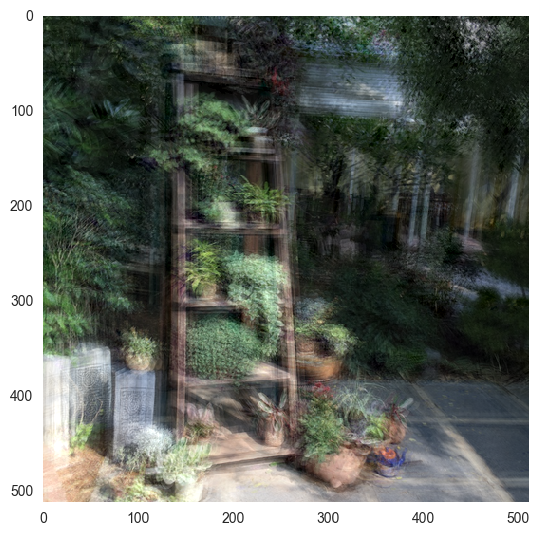

In [135]:
# Reconstructions of 3D images (5 to 10)
inverse_3 = pca_3.inverse_transform(trans_3)
matplotlib.style.use("seaborn-dark")
for i in range(5,10):
        io.imshow(show_image(inverse_3[i]))
        show()
#For multiple on a line, see Adrian's message

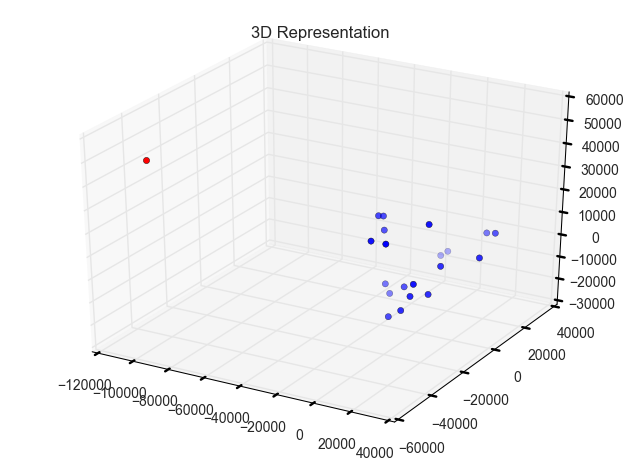

In [103]:
# Adding a new point which is really far
matplotlib.style.use('seaborn-whitegrid')
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X,Y,Z)
ax.scatter(-100000, -50000,50000, c ="red")
plt.title("3D Representation")

show()

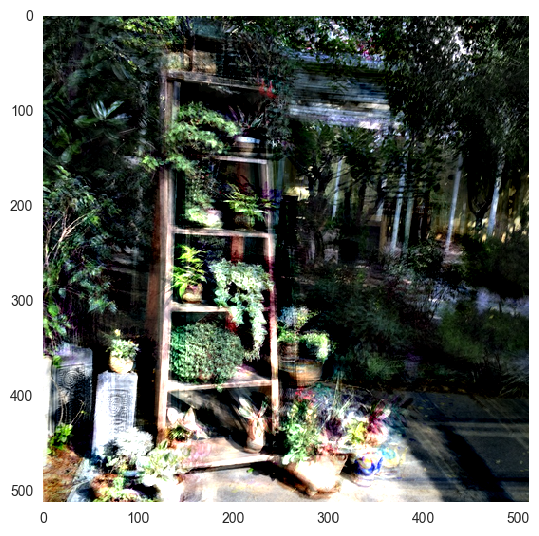

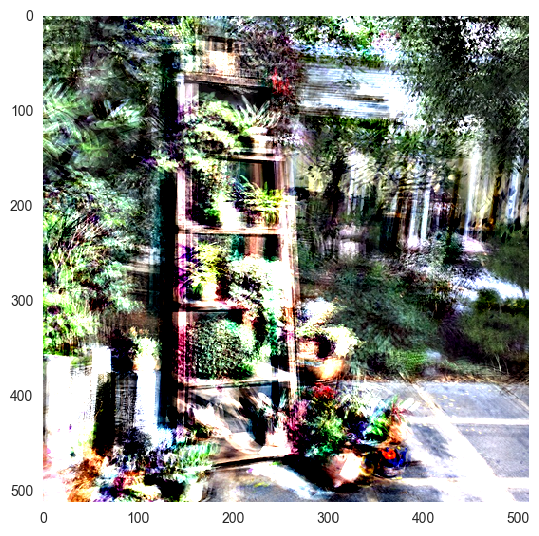

In [104]:
# Plot reconstructions of two far away points
matplotlib.style.use("seaborn-dark")
inverse_test = pca_2.inverse_transform([[50000,50000]])
io.imshow(show_image(inverse_test[0]))
inverse_test = pca_3.inverse_transform([[-100000,-50000,50000]])
io.imshow(show_image(inverse_test[0]))
show()

The plots illustrate that by picking a random point, it is possible to apply a filter on the image. By moving further away or closer to the points from the datasets, we can get different effects!